Loaded 10 images from E:\JupyterLocal\Eye_Tracking_Pipeline\eye_pipeline\GitHub_Eyepipeline\eye_pipeline\images
Loaded: 10
Processed 10 images.

========== PIPELINE TIMING ==========
STEP2_MODE: gray
DOWNSCALE (coarse): 0.1
DOWNSCALE_FINE:     1
PAD_PX=50, PAD_REL=0.0
Images processed: 10
Total runtime (batch wall): 0.0631 sec

========== 2-PASS TOTAL (COARSE + CROP + FINE) ==========
Avg per image: 5.46 ms
Approx FPS: 183.14

--- Major Breakdown (avg ms) ---
Coarse total    2.223
Crop step      0.173   (bbox map + padding + slice)
Fine total     3.065
2-pass sum     5.460

--- Production-ish (avg ms) ---
No viz draw (keep ellipse): 5.273
No viz + no ellipse:        4.287

--- Coarse step breakdown (avg ms) ---
coarse_roi     0.000
coarse_downscale 0.843
coarse_step2   0.018
coarse_threshold 0.937
coarse_pick    0.217
coarse_ellipse 0.157
coarse_viz     0.048
coarse_total   2.223

--- Fine step breakdown (avg ms) ---
fine_roi       0.000
fine_downscale 0.001
fine_step2     0.131
fine_t

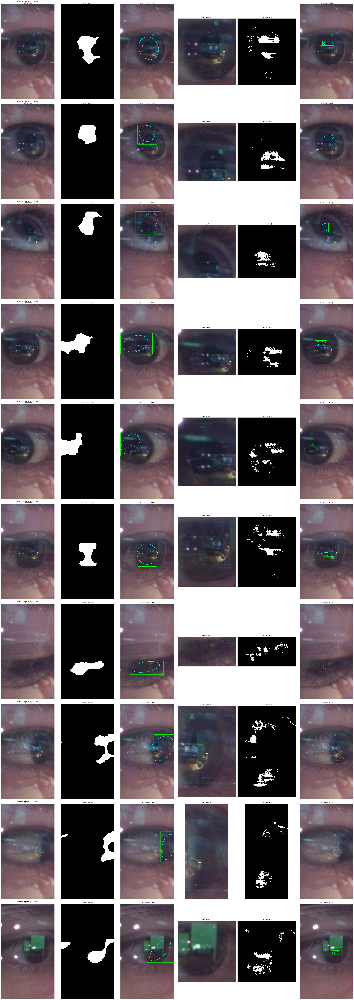

In [1]:
from eye_ops import settings as S
from eye_pipeline.io_images import load_rotated_images
from eye_pipeline.pipeline_2pass import run_pipeline_batch
from eye_pipeline.report import print_timing_summary

ROTATED_IMAGES, ROTATED_PATHS = load_rotated_images(max_images=200)
print("Loaded:", len(ROTATED_IMAGES))

imgs = ROTATED_IMAGES[:min(len(ROTATED_IMAGES), S.MAX_SHOW)]

PUPIL_RESULTS, TIMINGS, total_runtime = run_pipeline_batch(imgs)

print(f"Processed {len(PUPIL_RESULTS)} images.")
print_timing_summary(TIMINGS, total_runtime)


# ==============================
# Cell 2C — Storyboard View (Full -> Coarse -> Crop -> Fine)
# ==============================

import matplotlib.pyplot as plt
import cv2

from eye_ops.overlay import draw_pupil_overlay_on_full
from eye_ops.crop_map import crop_rotated_by_green_bbox, apply_padding
from eye_ops import settings as S

rows = len(PUPIL_RESULTS)
plt.figure(figsize=(36, rows * 10.0))  # 6 cols

for r, res in enumerate(PUPIL_RESULTS):
    full = ROTATED_IMAGES[r]
    title = ROTATED_PATHS[r].name if "ROTATED_PATHS" in globals() else f"img_{r}"

    coarse = res.get("coarse", None)
    fine = res

    # --- ensure we have a crop image (prefer stored) ---
    crop_bgr = res.get("crop_bgr", None)
    if crop_bgr is None:
        src_for_crop = coarse if coarse is not None else fine
        _, bb = crop_rotated_by_green_bbox(full, src_for_crop)
        if bb is not None:
            bb_pad = apply_padding(bb, full.shape, S.PAD_PX, S.PAD_REL)
            if bb_pad is not None:
                X0, Y0, X1, Y1 = bb_pad
                crop_bgr = full[Y0:Y1, X0:X1].copy()

    # --- overlays mapped onto FULL image ---
    full_coarse_viz = draw_pupil_overlay_on_full(full, coarse, draw_bbox=True) if coarse else full.copy()
    full_fine_viz   = draw_pupil_overlay_on_full(full, fine,   draw_bbox=True) if fine else full.copy()

    # --- Column 1: Full rotated ---
    ax = plt.subplot(rows, 6, r*6 + 1)
    ax.imshow(cv2.cvtColor(full, cv2.COLOR_BGR2RGB))
    ax.set_title(f"{title}\nFull ROTATED", fontsize=9)
    ax.axis("off")

    # --- Column 2: Coarse mask (ROI space) ---
    ax = plt.subplot(rows, 6, r*6 + 2)
    if coarse is not None:
        ax.imshow(coarse["mask_pct"], cmap="gray")
        ax.set_title("Coarse Mask (ROI)", fontsize=9)
    else:
        ax.set_title("Coarse Mask: None", fontsize=9)
    ax.axis("off")

    # --- Column 3: Coarse overlays on FULL ---
    ax = plt.subplot(rows, 6, r*6 + 3)
    ax.imshow(cv2.cvtColor(full_coarse_viz, cv2.COLOR_BGR2RGB))
    ax.set_title("Coarse Overlays (FULL)", fontsize=9)
    ax.axis("off")

    # --- Column 4: Cropped (padded) ---
    ax = plt.subplot(rows, 6, r*6 + 4)
    if crop_bgr is not None:
        ax.imshow(cv2.cvtColor(crop_bgr, cv2.COLOR_BGR2RGB))
        ax.set_title("Crop (padded)", fontsize=9)
    else:
        ax.set_title("Crop: None", fontsize=9)
    ax.axis("off")

    # --- Column 5: Fine mask (crop space) ---
    ax = plt.subplot(rows, 6, r*6 + 5)
    ax.imshow(fine["mask_pct"], cmap="gray")
    ax.set_title("Fine Mask (crop)", fontsize=9)
    ax.axis("off")

    # --- Column 6: Fine overlays on FULL ---
    ax = plt.subplot(rows, 6, r*6 + 6)
    ax.imshow(cv2.cvtColor(full_fine_viz, cv2.COLOR_BGR2RGB))
    ax.set_title("Fine Overlays (FULL)", fontsize=9)
    ax.axis("off")

plt.tight_layout()
plt.show()
